<a href="https://colab.research.google.com/github/Hamcase/ReadTheDocs_v2/blob/master/Notebook/best.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os

In [ ]:
import glob

In [ ]:
from IPython.display import Image, display

In [ ]:
from IPython import display

In [ ]:
display.clear_output()

In [ ]:
!nvidia-smi

Fri Nov 22 16:34:07 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8              10W /  70W |      3MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
HOME = os.getcwd()

In [ ]:
print(HOME)

/content


In [ ]:
!pip install ultralytics

In [ ]:
import ultralytics

In [ ]:
ultralytics.checks()

Ultralytics 8.3.36 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.9/112.6 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="zoxbmxlbFalgoSDsUk7h")
project = rf.workspace("david-lee-d0rhs").project("american-sign-language-letters")
version = project.version(6)
dataset = version.download("yolov8")


mkdir: cannot create directory ‘/content/datasets’: File exists
/content/datasets
loading Roboflow workspace...
loading Roboflow project...


In [ ]:
%cd {HOME}

/content


In [ ]:
%cd {dataset.location}

/content/datasets/American-Sign-Language-Letters-6


In [ ]:
%cd {HOME}
!yolo task=detect mode=train model=yolov8l.pt data={dataset.location}/data.yaml epochs=20 imgsz=800

/content
Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8l.pt, data=/content/datasets/American-Sign-Language-Letters-1/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, 

In [ ]:
!yolo task=detect mode=train data={dataset.location}/data.yaml model=/content/bestTOTEST.pt epochs=50 imgsz=800 batch=16


Ultralytics 8.3.36 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/bestTOTEST.pt, data=/content/datasets/American-Sign-Language-Letters-6/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False

In [ ]:
!ls {HOME}/runs/detect/train2/

args.yaml					    R_curve.png		val_batch0_labels.jpg
confusion_matrix_normalized.png			    results.csv		val_batch0_pred.jpg
confusion_matrix.png				    results.png		val_batch1_labels.jpg
events.out.tfevents.1731358127.568265d96cdc.1268.0  train_batch0.jpg	val_batch1_pred.jpg
F1_curve.png					    train_batch1.jpg	val_batch2_labels.jpg
labels_correlogram.jpg				    train_batch2.jpg	val_batch2_pred.jpg
labels.jpg					    train_batch950.jpg	weights
P_curve.png					    train_batch951.jpg
PR_curve.png					    train_batch952.jpg


/content


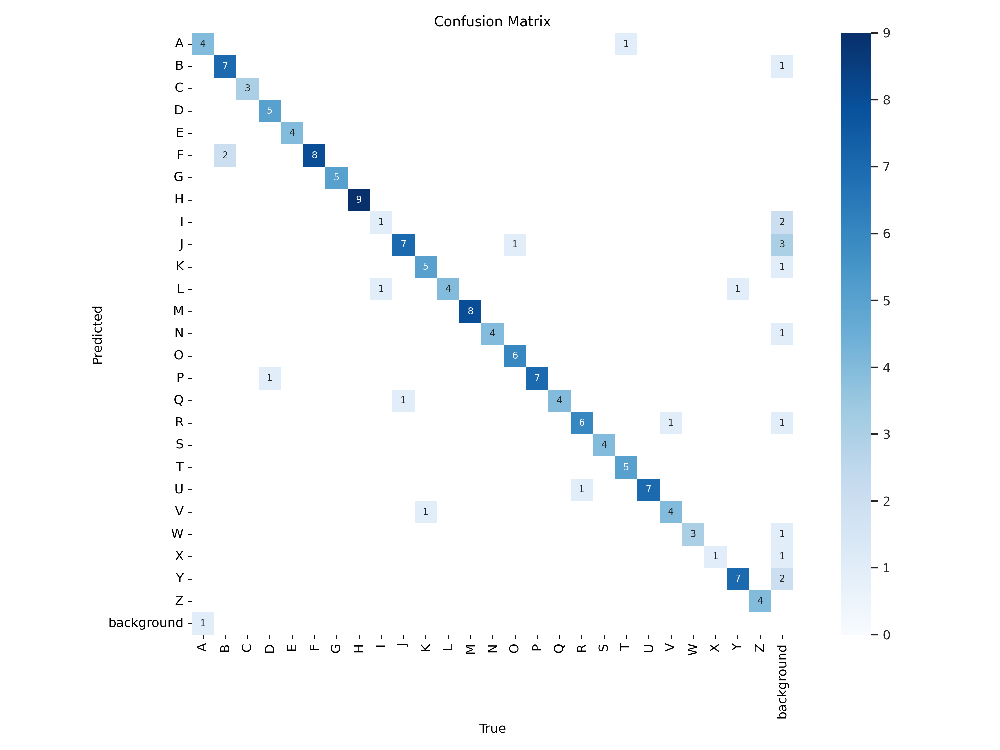

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train2/confusion_matrix.png', width=900)

/content


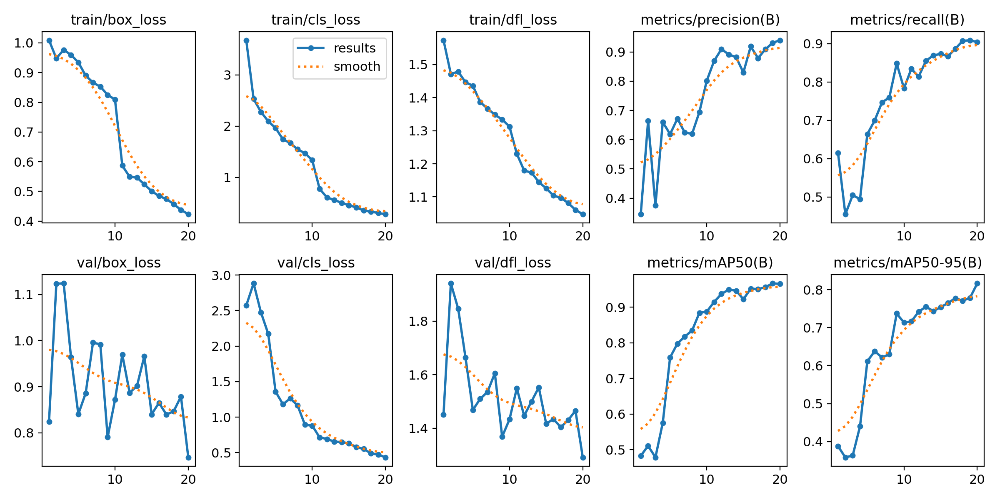

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train2/results.png', width=600)

/content


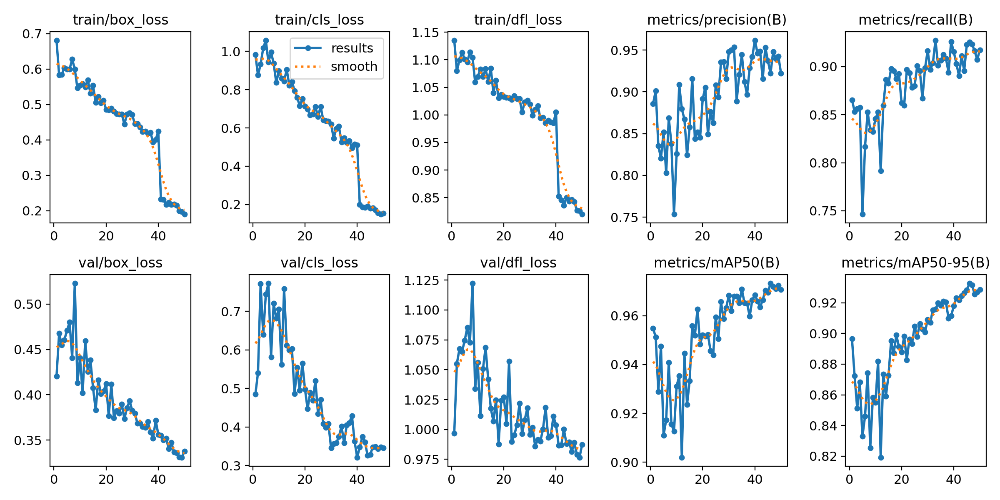

In [ ]:
%cd {HOME}
Image(filename=f'/content/datasets/American-Sign-Language-Letters-6/runs/detect/train/results.png', width=600)

/content


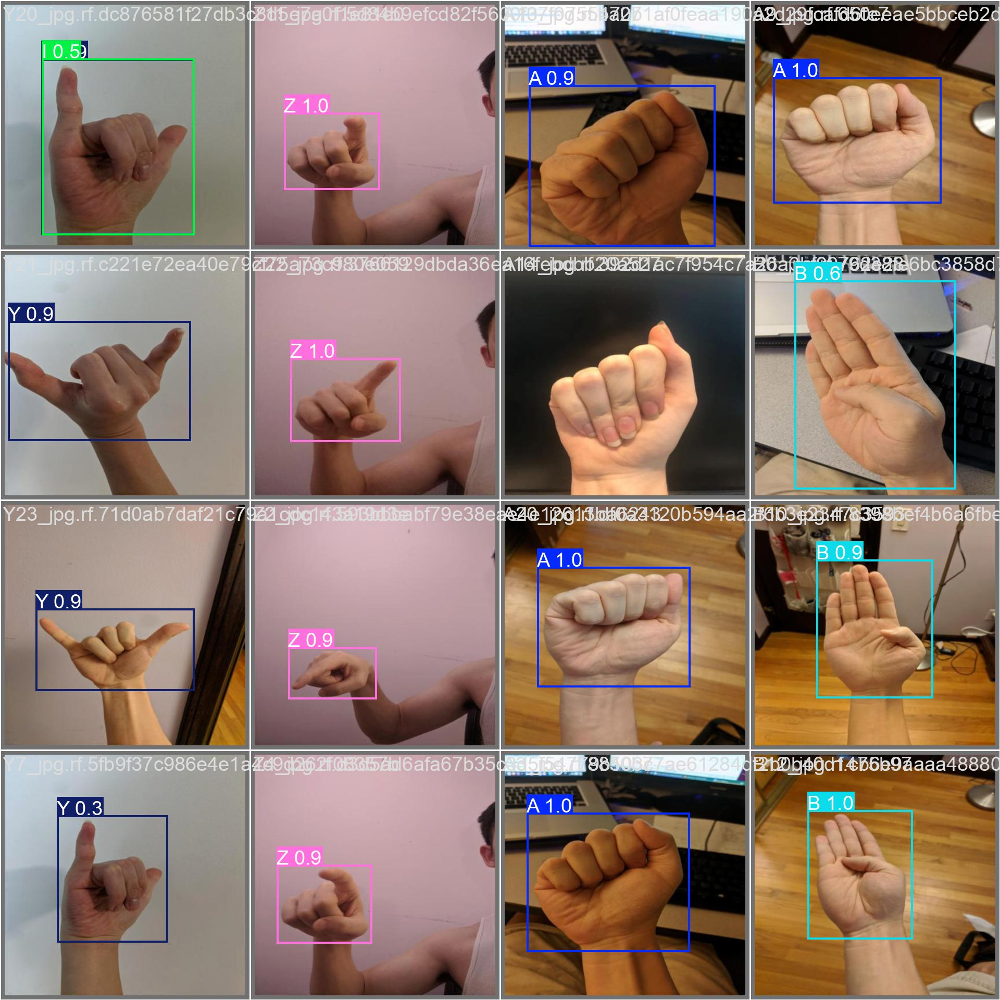

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train2/val_batch0_pred.jpg', width=600)

In [ ]:
%cd {HOME}
!yolo task=detect mode=val model=/content/runs/detect/train2/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 43,626,654 parameters, 0 gradients, 164.9 GFLOPs
val: Scanning /content/datasets/American-Sign-Language-Letters-1/valid/labels.cache... 144 images, 0 backgrounds, 0 corrupt: 100% 144/144 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 9/9 [00:09<00:00,  1.05s/it]
                   all        144        144       0.94      0.904      0.965      0.816
                     A          5          5      0.931        0.8      0.962      0.833
                     B          9          9          1      0.658      0.995      0.873
                     C          3          3      0.944          1      0.995      0.841
                     D          6          6          1      0.863      0.995      0.874
                     E          4          4      0.965          1      0.995      0.873
            

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model=/content/runs/detect/train2/weights/best.pt conf=0.25 source={dataset.location}/test/images

/content
Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 43,626,654 parameters, 0 gradients, 164.9 GFLOPs

image 1/72 /content/datasets/American-Sign-Language-Letters-1/test/images/A22_jpg.rf.f02ad8558ce1c88213b4f83c0bc66bc8.jpg: 800x800 1 A, 78.5ms
image 2/72 /content/datasets/American-Sign-Language-Letters-1/test/images/B14_jpg.rf.ed5ba6d44f55ab03e62d2baeac4aa1aa.jpg: 800x800 1 B, 65.4ms
image 3/72 /content/datasets/American-Sign-Language-Letters-1/test/images/B15_jpg.rf.0f0628552139144fc67c453e1f1b7b15.jpg: 800x800 1 B, 65.4ms
image 4/72 /content/datasets/American-Sign-Language-Letters-1/test/images/B19_jpg.rf.69527cc1f34d694cc04e55db80ed9b1a.jpg: 800x800 1 B, 61.7ms
image 5/72 /content/datasets/American-Sign-Language-Letters-1/test/images/C17_jpg.rf.ceb81f8ae3c3673bd060ebe71848eca8.jpg: 800x800 1 C, 54.7ms
image 6/72 /content/datasets/American-Sign-Language-Letters-1/test/images/C19_jpg.rf.577ce02a223c65e89dc4a4ea

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model=/content/runs/detect/train2/weights/best.pt conf=0.25 source=/content/video.mp4

Streaming output truncated to the last 5000 lines.
video 1/1 (frame 4313/9309) /content/video.mp4: 480x800 1 V, 37.2ms
video 1/1 (frame 4314/9309) /content/video.mp4: 480x800 1 V, 36.7ms
video 1/1 (frame 4315/9309) /content/video.mp4: 480x800 1 V, 38.2ms
video 1/1 (frame 4316/9309) /content/video.mp4: 480x800 1 V, 39.8ms
video 1/1 (frame 4317/9309) /content/video.mp4: 480x800 1 V, 37.8ms
video 1/1 (frame 4318/9309) /content/video.mp4: 480x800 1 V, 36.1ms
video 1/1 (frame 4319/9309) /content/video.mp4: 480x800 1 V, 36.4ms
video 1/1 (frame 4320/9309) /content/video.mp4: 480x800 1 V, 38.5ms
video 1/1 (frame 4321/9309) /content/video.mp4: 480x800 1 V, 38.5ms
video 1/1 (frame 4322/9309) /content/video.mp4: 480x800 1 V, 37.2ms
video 1/1 (frame 4323/9309) /content/video.mp4: 480x800 1 V, 36.4ms
video 1/1 (frame 4324/9309) /content/video.mp4: 480x800 1 V, 38.7ms
video 1/1 (frame 4325/9309) /content/video.mp4: 480x800 1 V, 39.3ms
video 1/1 (frame 4326/9309) /content/video.mp4: 480x800 1 V, 37.9

In [ ]:
!rm "/content/result_compressed.mp4"

rm: cannot remove '/content/result_compressed.mp4': No such file or directory


In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

save_path = '/content/runs/detect/predict2/video.avi'

compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)